# 1. Cargamos las librerías

In [2]:
from pprint import pprint
from datetime import datetime
import numpy as np
import pandas as pd
import matplotlib
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import matplotlib.axes as ax
import seaborn as sns
import plotly.express as px
import scipy
from scipy import stats
import os
import statsmodels.api as sm
import plotly.graph_objects as go
import plotly.subplots as su
from sklearn.linear_model import LinearRegression
!pip install dash
import dash
from dash import dcc, html

## 2. Cargamos los datos del notebook de limpieza para poder trabajar con ellos 

In [4]:
# Creamos una función para añadir una columna con las estaciones a los dataframes
def estacion(m):
    if   m in [12, 1, 2]: return "Invierno"
    elif m in [3, 4, 5]:  return "Primavera"
    elif m in [6, 7, 8]:  return "Verano"
    else:                 return "Otoño"

In [3]:
df_ponte = pd.concat(objs = [pd.read_csv(x) for x in os.listdir() if x.startswith("ponte") and x.endswith(".csv")],
                     ignore_index = True)

df_ponte = df_ponte.drop(labels = "Unnamed: 0", axis = 1)

df_ponte["Fecha"] = df_ponte["Fecha"].apply(lambda x : datetime.strptime(x, "%Y-%m-%d"))
df_ponte["Year"] = df_ponte["Fecha"].apply(lambda x : x.year)
df_ponte["Estacion"] = df_ponte["Fecha"].dt.month.apply(estacion)
df_ponte["Mes"] = df_ponte["Fecha"].apply(lambda x : x.month)

rename_columns = {"Momento (UNIX) de la vel. máx. del veinto" : "Momento (UNIX) de la vel. máx. del viento",
                  "Profundidad de la neive" : "Profundidad de la nieve",
                  "Vel. ráfaga de viento max." : "Vel. ráfaga de viento máx."}

df_ponte = df_ponte.rename(columns = rename_columns)

#df_ponte

NameError: name 'estacion' is not defined

In [ ]:
df_coruña = pd.concat(objs = [pd.read_csv(x) for x in os.listdir() if x.startswith("coruña") and x.endswith(".csv")],
                     ignore_index = True)

df_coruña = df_coruña.drop(labels = "Unnamed: 0", axis = 1)

df_coruña["Fecha"] = df_coruña["Fecha"].apply(lambda x : datetime.strptime(x, "%Y-%m-%d"))

df_coruña["Year"] = df_coruña["Fecha"].apply(lambda x : x.year)
df_coruña["Estacion"] = df_coruña["Fecha"].dt.month.apply(estacion)
df_coruña["Mes"] = df_coruña["Fecha"].apply(lambda x : x.month)

rename_columns = {"Momento (UNIX) de la vel. máx. del veinto" : "Momento (UNIX) de la vel. máx. del viento",
                  "Profundidad de la neive" : "Profundidad de la nieve",
                  "Vel. ráfaga de viento max." : "Vel. ráfaga de viento máx."}

df_coruña = df_coruña.rename(columns = rename_columns)

# df_coruña

In [ ]:
df_caldes = pd.concat(objs = [pd.read_csv(x) for x in os.listdir() if x.startswith("caldes") and x.endswith(".csv")],
                     ignore_index = True)

df_caldes = df_caldes.drop(labels = "Unnamed: 0", axis = 1)

df_caldes["Fecha"] = df_caldes["Fecha"].apply(lambda x : datetime.strptime(x, "%Y-%m-%d"))

df_caldes["Year"] = df_caldes["Fecha"].apply(lambda x : x.year)
df_caldes["Estacion"] = df_caldes["Fecha"].dt.month.apply(estacion)
df_caldes["Mes"] = df_caldes["Fecha"].apply(lambda x : x.month)

rename_columns = {"Momento (UNIX) de la vel. máx. del veinto" : "Momento (UNIX) de la vel. máx. del viento",
                  "Profundidad de la neive" : "Profundidad de la nieve",
                  "Vel. ráfaga de viento max." : "Vel. ráfaga de viento máx."}

df_caldes = df_caldes.rename(columns = rename_columns)

# df_caldes

In [8]:
df_palmadr = pd.concat(objs = [pd.read_csv(x) for x in os.listdir() if x.startswith("palmadr") and x.endswith(".csv")],
                     ignore_index = True)

df_palmadr = df_palmadr.drop(labels = "Unnamed: 0", axis = 1)

df_palmadr["Fecha"] = df_palmadr["Fecha"].apply(lambda x : datetime.strptime(x, "%Y-%m-%d"))

df_palmadr["Year"] = df_palmadr["Fecha"].apply(lambda x : x.year)
df_palmadr["Mes"] = df_palmadr["Fecha"].apply(lambda x : x.month)
df_palmadr["Estacion"] = df_palmadr["Fecha"].dt.month.apply(estacion)

rename_columns = {"Momento (UNIX) de la vel. máx. del veinto" : "Momento (UNIX) de la vel. máx. del viento",
                  "Profundidad de la neive" : "Profundidad de la nieve",
                  "Vel. ráfaga de viento max." : "Vel. ráfaga de viento máx."}

df_palmadr = df_palmadr.rename(columns = rename_columns)

# df_palmadr

In [16]:
df_conjunto = pd.concat(objs = [pd.read_csv(x) for x in os.listdir() if x.startswith("df_") and x.endswith(".csv")],
                     ignore_index = True)

df_conjunto["Mom. Temp. Máx. Datetime"] = pd.to_datetime(df_conjunto["Momento temperatura máxima (UNIX)"], unit = "s")
df_conjunto["Mom. Temp. Mín. Datetime"] = pd.to_datetime(df_conjunto["Momento temperatura mínima (UNIX)"], unit = "s")

df_conjunto = df_conjunto.drop(labels = "Unnamed: 0", axis = 1)

# df_conjunto

# 3. Preguntas

### 3.1.1. ¿Hace más viento en el norte o en el sur de Galicia ? 

In [14]:
# Respuesta:

viento = df_conjunto.groupby(by = "Ciudad").agg({"Media de la vel. del viento (m/s)": "mean"})

viento_AC = viento.loc["A Coruña"]
print("- El viento en A Coruña es: ", viento_AC[0], "m/s")

viento_P = viento.loc["Pontevedra"]
print("- El viento en Pontevedra es: ", viento_P[0], "m/s")

if viento_AC[0] > viento_P[0]:
    print ("Hace más viento en el norte")
elif viento_AC[0] == viento_P[0]:
    print("Hace el mismo viento en ambos lugares")
else:
    print("Hace más viento en el sur")

- El viento en A Coruña es:  3.460164271047228 m/s
- El viento en Pontevedra es:  1.9745379876796716 m/s
Hace más viento en el norte


C:\Users\anton\AppData\Local\Temp\ipykernel_23444\890263249.py:6: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print("- El viento en A Coruña es: ", viento_AC[0], "m/s")
C:\Users\anton\AppData\Local\Temp\ipykernel_23444\890263249.py:9: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print("- El viento en Pontevedra es: ", viento_P[0], "m/s")
C:\Users\anton\AppData\Local\Temp\ipykernel_23444\890263249.py:11: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, us

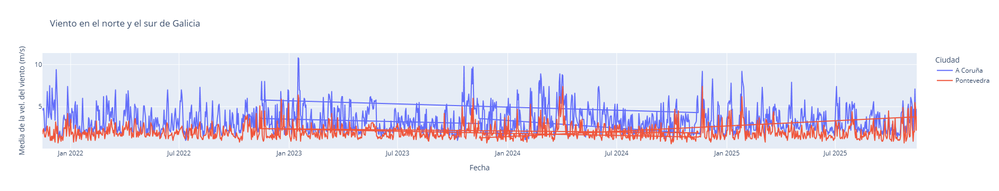

In [15]:
#Filtramos el Dataframe para elegir solamente las ciudades pertenecientes a Galicia:

df_Galicia = df_conjunto[df_conjunto["Ciudad"].isin(["A Coruña", "Pontevedra"])]

# Gráfica de apoyo:

fig = px.line(df_Galicia,
              x = "Fecha",
              y = "Media de la vel. del viento (m/s)",
              title = "Viento en el norte y el sur de Galicia",
              color = "Ciudad",
              # markers = True,
              category_orders = {"Ciudad": ["A Coruña", "Pontevedra"]})

fig.show()

### 3.1.2. ¿Cuál es el rango más frecuente de velocidad del viento por ciudades? 

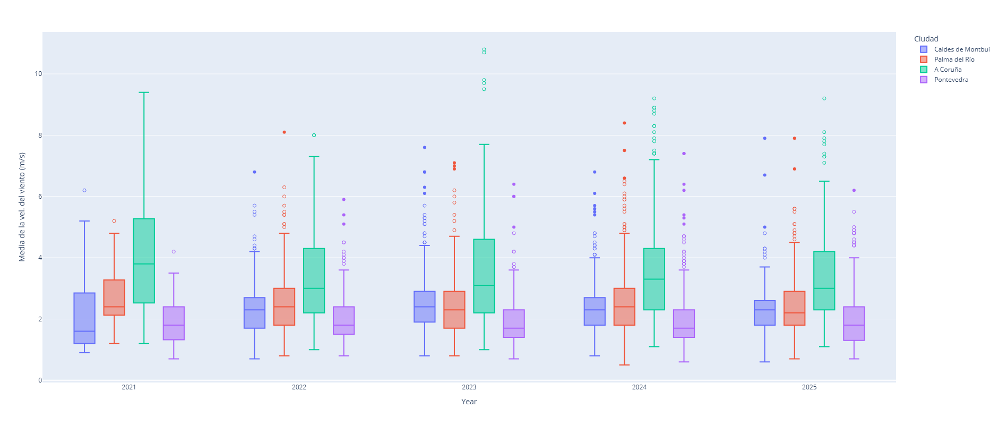

In [16]:
px.box(data_frame = df_conjunto,
       x          = "Year",
       y          = "Media de la vel. del viento (m/s)",
       category_orders = {"Ciudad": ["Caldes de Montbui", "Palma del Río", "A Coruña", "Pontevedra"]},
       color      = "Ciudad",
       # facet_col  = "Generation",
       points     = "suspectedoutliers",
       hover_name = "Ciudad",
       width = 1000,
       height = 800)

**Interpretación de los datos:**
Podemos observar que con mucha diferéncia A Coruña es la ciudad con la media de velocidad del viento más alta, y la que menos (siendo constante) Pontevendra. Suponemos que Caldes de Montbui en 2021 tiene la menor media por falta de datos, ya que solo tenemos datos de Noviembre en adelante.

### 3.2. ¿Cuál es el mes más caluroso por ciudad?

In [17]:
calor = df_conjunto.groupby(by = ["Ciudad", "Mes"]).agg({"Temperatura máxima": "max",})
#calor

mes_caluroso = calor.loc[calor.groupby("Ciudad")["Temperatura máxima"].idxmax()]
mes_caluroso

,,Temperatura máxima
Ciudad,Mes,
A Coruña,10,33.3
Caldes de Montbui,7,40.0
Palma del Río,8,43.0
Pontevedra,7,38.7


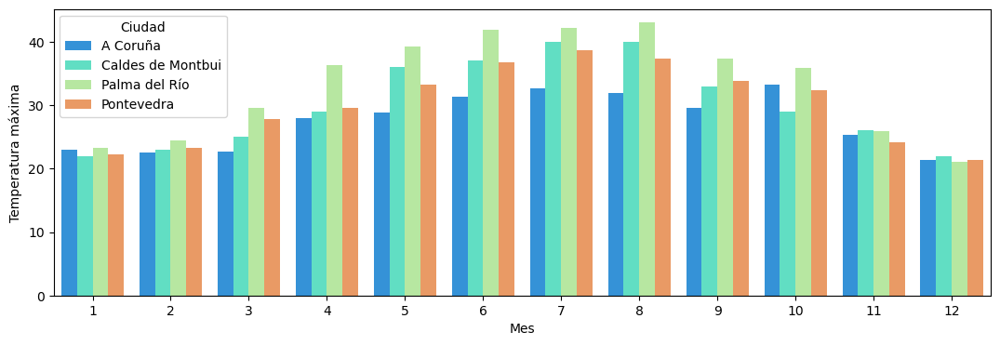

In [18]:
# Gráfica de apoyo:

plt.figure(figsize = (13, 4),)

sns.barplot(x = "Mes", 
            y = "Temperatura máxima", 
            hue = "Ciudad", 
            data = calor, 
            palette = "rainbow")

plt.show()

### 3.3. ¿Cuál es la ciudad que tiene mayor temperatura máxima y la que tiene menor temperatura mínima?

In [19]:
max_min = df_conjunto.groupby(by = ["Ciudad"]).agg({"Temperatura máxima": "max",
                                                    "Temperatura mínima": "min"}).reset_index()
# max_min

mayor_temp_max = max_min.loc[max_min["Temperatura máxima"].idxmax()]
print("La ciudad con mayor temperatura máxima es", mayor_temp_max[0], "con una media de:", mayor_temp_max[1], "ºC")

menor_temp_min = max_min.loc[max_min["Temperatura mínima"].idxmin()]
print("La ciudad con menor temperatura mínima es", menor_temp_min[0], "con una media de:", menor_temp_min[2], "ºC")

La ciudad con mayor temperatura máxima es Palma del Río con una media de: 43.0 ºC
La ciudad con menor temperatura mínima es Caldes de Montbui con una media de: -5.0 ºC


C:\Users\anton\AppData\Local\Temp\ipykernel_23444\3582716425.py:6: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`

C:\Users\anton\AppData\Local\Temp\ipykernel_23444\3582716425.py:9: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`



C:\Users\anton\AppData\Local\Temp\ipykernel_23444\21113268.py:7: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`

C:\Users\anton\AppData\Local\Temp\ipykernel_23444\21113268.py:13: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`

C:\Users\anton\AppData\Local\Temp\ipykernel_23444\21113268.py:19: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`



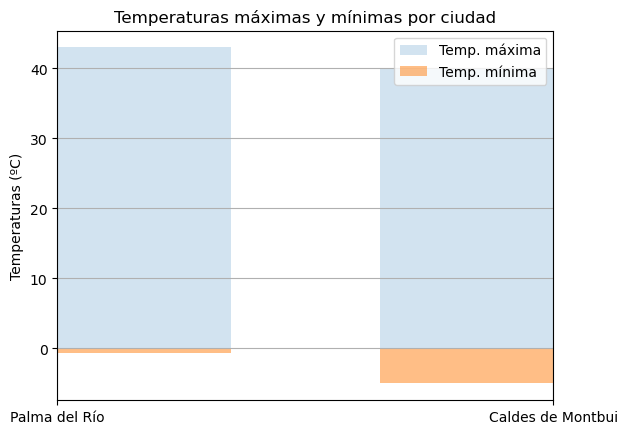

In [20]:
# Gráfica de apoyo:

plt.bar(max_min["Ciudad"], 
        max_min["Temperatura máxima"],
        width = 0.7,
        label= "Temp. máxima", 
        data = mayor_temp_max[0],
        alpha=0.2)
plt.bar(max_min["Ciudad"], 
        max_min["Temperatura mínima"], 
        width = 0.7,
        label="Temp. mínima", 
        data = menor_temp_min[0],
        alpha=0.5)

plt.legend()
plt.grid()
plt.ylabel("Temperaturas (ºC)")
plt.xlim(mayor_temp_max[0], menor_temp_min[0])
plt.title("Temperaturas máximas y mínimas por ciudad")
plt.show()

### 3.4. De las ciudades frías, agrupemos la acumulación de precipitaciones por meses.

In [21]:
df_ciudades_frias = df_conjunto[df_conjunto["Temperatura mínima"] < 0].groupby(by = "Ciudad").agg({"Temperatura mínima" : "min"})
df_ciudades_frias

,Temperatura mínima
Ciudad,
Caldes de Montbui,-5.0
Palma del Río,-0.7


In [23]:
df_prec_caldes = df_conjunto[0 : 1461]
df_conjunto[0 : 1461]
df_prec_caldes.groupby(by = "Mes").agg({"Ciudad" : "max",
                                        "Acumulación de precipitaciones (l/m2)" : "mean"})

,Ciudad,Acumulación de precipitaciones (l/m2)
Mes,,
1,Caldes de Montbui,0.724194
2,Caldes de Montbui,1.387611
3,Caldes de Montbui,3.741935
4,Caldes de Montbui,2.268333
5,Caldes de Montbui,2.731452
6,Caldes de Montbui,1.765833
7,Caldes de Montbui,1.348387
8,Caldes de Montbui,1.607258
9,Caldes de Montbui,2.576667


In [29]:
df_prec_palmadr = df_conjunto[2922 : 4383]
df_prec_palmadr.groupby(by = "Mes").agg({"Ciudad" : "max",
                                         "Acumulación de precipitaciones (l/m2)" : "mean"})

,Ciudad,Acumulación de precipitaciones (l/m2)
Mes,,
1,Palma del Río,2.340323
2,Palma del Río,1.630973
3,Palma del Río,6.351613
4,Palma del Río,2.207500
5,Palma del Río,1.364516
6,Palma del Río,1.115000
7,Palma del Río,0.061290
8,Palma del Río,0.107258
9,Palma del Río,1.097500


### 3.5. ¿Cuál es la ciudad más lluviosa y en cuál llueve menos?

In [31]:
lluvia = df_conjunto.groupby(by = ["Ciudad"]).agg({"Acumulación de precipitaciones (l/m2)": "mean",
                                                  }).reset_index()
# lluvia

llueve_mas = lluvia.loc[lluvia["Acumulación de precipitaciones (l/m2)"].idxmax()]
print("La ciudad donde más llueve es", llueve_mas["Ciudad"], "con una media de:", llueve_mas["Acumulación de precipitaciones (l/m2)"], "l/m2")

llueve_menos = lluvia.loc[lluvia["Acumulación de precipitaciones (l/m2)"].idxmin()]
print("La ciudad donde menos llueve es", llueve_menos["Ciudad"], "con una media de:", llueve_menos["Acumulación de precipitaciones (l/m2)"], "l/m2")

La ciudad donde más llueve es Pontevedra con una media de: 6.369746748802191 l/m2
La ciudad donde menos llueve es Caldes de Montbui con una media de: 1.9505817932922658 l/m2


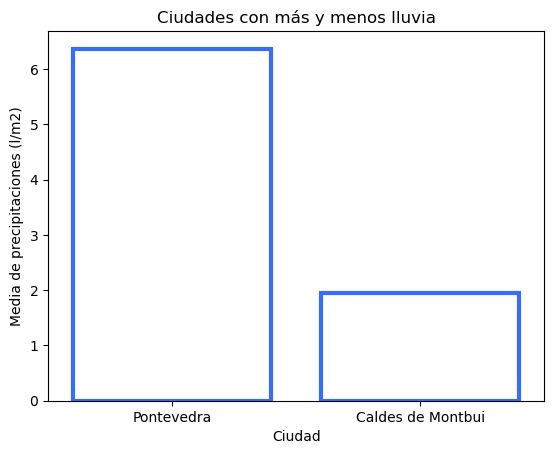

In [32]:
lluvia_completa = pd.DataFrame({"Ciudad": [llueve_mas["Ciudad"], llueve_menos["Ciudad"]],
                                "Precipitaciones": [llueve_mas["Acumulación de precipitaciones (l/m2)"],llueve_menos["Acumulación de precipitaciones (l/m2)"]]
                               })

sns.barplot(x= "Ciudad",
            y= "Precipitaciones",
            data= lluvia_completa,
            hue = "Ciudad",
            palette = "rainbow",
            facecolor = (1, 1, 1),
            linewidth = 3,
            edgecolor = sns.color_palette("rainbow"))

plt.title("Ciudades con más y menos lluvia")
plt.ylabel("Media de precipitaciones (l/m2)")
plt.show()


### 3.6. ¿La temperatura y la humedad influyen en el punto de rocío? 

Veamos que ocurre en dos ciudades del norte de España

**- Caldes de Montbui**


Para ver esto haremos regresión lineal múltiple:

In [33]:
X = df_caldes[["Media de la temperatura", "Media humedad"]]
Y = df_caldes["Media punto de rocío"]

model = LinearRegression()
model.fit(X, Y)

print("Intercept:", model.intercept_)
print("Coeficientes:", model.coef_)
print("R²:", model.score(X, Y))

Intercept: -22.85649697134695
Coeficientes: [0.95251471 0.25107619]
R²: 0.9943408473773464


**Interpretación de los datos:**
Podemos sacar varias conclusiones que físicamente tienen mucho sentido. 
Lo primero, el valor obtenido de los coeficientes indica que el punto de rocío está determinado casi linealmente sobre todo por la temperatura (coeficiente = 0.95251471) y en menor medida por la humedad (coeficiente= 0.25107619).
La temperatura es la variable principal que controla la capacidad del aire para saturarse y la humedad se encarga de regular.

**- Pontevedra**

Para ver esto haremos regresión lineal múltiple:

In [34]:
X = df_ponte[["Media de la temperatura", "Media humedad"]]
Y = df_ponte["Media punto de rocío"]

model = LinearRegression()
model.fit(X, Y)

print("Intercept:", model.intercept_)
print("Coeficientes:", model.coef_)
print("R²:", model.score(X, Y))

Intercept: -20.494737602915464
Coeficientes: [0.95552187 0.21709311]
R²: 0.9946652479335619


**Interpretación de los datos:** Nuevamente los datos vuelven a tener mucho sentido y de hecho son resultados muy similares a Caldes. La temperatura vuelve a ser la variable principal. Además, seguimos obteniendo un R^2 alto (aprox. 0.99) lo cuál es muy buen indicativo de que mis variables (Temperatura y humedad) explican el modelo. 

### 3.7. ¿Hay correlación entre la temperatura máxima y el índice de radiación solar?

Esta vez lo veremos en una ciudad del sur y una del norte de España

**- Palma del Río**

In [183]:
stats.pearsonr(df_palmadr["Temperatura máxima"],df_palmadr["Total de la radiación solar concentrada"])

PearsonRResult(statistic=np.float64(0.7577650845640193), pvalue=np.float64(8.703915049731878e-273))

Usaremos una **gráfica** para visualizar los resultados, que indican una correlación fuerte entre estas variables, lo cuál fisicamente tiene mucho sentido. La mejor gráfica en estos casos es un scatter plot con línea de tendencia que según los datos obtenidos tendría que salir una línea creciente y una nube de puntos agrupada y también creciente. 

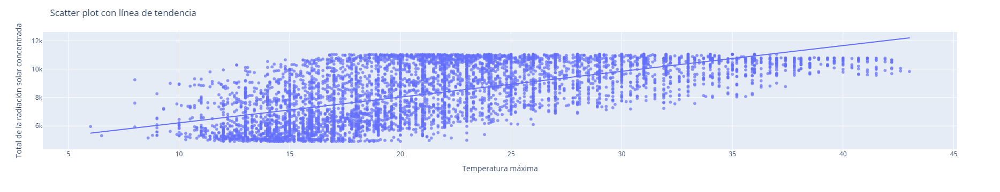

In [35]:
fig = px.scatter(
    df_conjunto,
    x="Temperatura máxima",
    y="Total de la radiación solar concentrada",
    trendline="ols",  
    opacity=0.7
)

fig.update_layout(
    title="Scatter plot con línea de tendencia",
    xaxis_title="Temperatura máxima",
    yaxis_title="Total de la radiación solar concentrada"
)

fig.show()

**- A Coruña**

In [36]:
stats.pearsonr(df_coruña["Temperatura máxima"],df_coruña["Total de la radiación solar concentrada"])

PearsonRResult(statistic=np.float64(0.5593799581099388), pvalue=np.float64(4.729284917982953e-121))

Esta vez la correlación sale moderada en vez de fuerte pero dado lo pequeño que es el p-value muy significativa también. Nuevamente, si nos apoyamos en la gráfica veremos una tendencia creciente a pesar de encontrarnos con algo de dispersión en la nube de puntos.

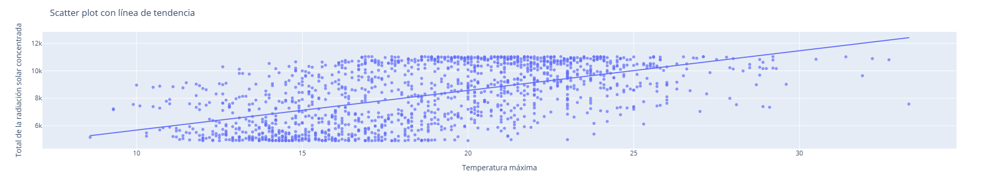

In [37]:
fig = px.scatter(
    df_coruña,
    x="Temperatura máxima",
    y="Total de la radiación solar concentrada",
    trendline="ols",  
    opacity=0.7
)

fig.update_layout(
    title="Scatter plot con línea de tendencia",
    xaxis_title="Temperatura máxima",
    yaxis_title="Total de la radiación solar concentrada"
)

fig.show()

### 3.8. Variación de temperatura entre Enero de 2022 y Enero de 2025

Sería interesante ver como ha variado la temperatura media a lo largo de estos años en España. Compararemos dicha variación tomando como referencia una ciudad del norte de España y una ciudad del sur. 

In [39]:
#Ponte
enero_p = df_ponte[df_ponte["Mes"] == 1]
enero_p = enero_p.groupby(by="Year", as_index=False).agg({"Media de la temperatura":"mean"})
enero_p 

,Year,Media de la temperatura
0,2022,10.161290
1,2023,9.406452
2,2024,11.012903
3,2025,10.951613


Visualicémoslo con un gráfico:

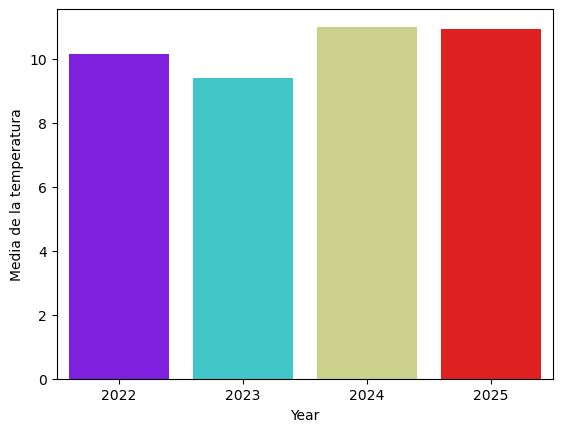

In [40]:
sns.barplot(x = "Year", 
            y = "Media de la temperatura", 
            hue = "Year", 
            data = enero_p, 
            palette="rainbow",
            legend=False)
plt.show()

También podemos ver de cuanto ha sido esa variación

In [57]:
i = len(enero_p["Media de la temperatura"]) - 1
diferencia_p = enero_p["Media de la temperatura"][0] - enero_p["Media de la temperatura"][i]
diferencia_p

np.float64(-0.7903225806451601)

Tenemos una diferencia de algo menos de 1 grado entre el 2022 y el 2025. Aún así, si nos fijamos en el gráfico de barras, en 2023 hubo una bajada significativa. 

Hagamos ahora este análisis para Palma del Río, ciudad del sur de España.

In [43]:
# Palma del Río
enero_pdr = df_palmadr[df_palmadr["Mes"] == 1]
enero_pdr = enero_pdr.groupby(by="Year", as_index=False).agg({"Media de la temperatura":"mean"})
enero_pdr

,Year,Media de la temperatura
0,2022,9.974194
1,2023,9.761290
2,2024,11.732258
3,2025,10.790323


Visualicémoslo con un gráfico:

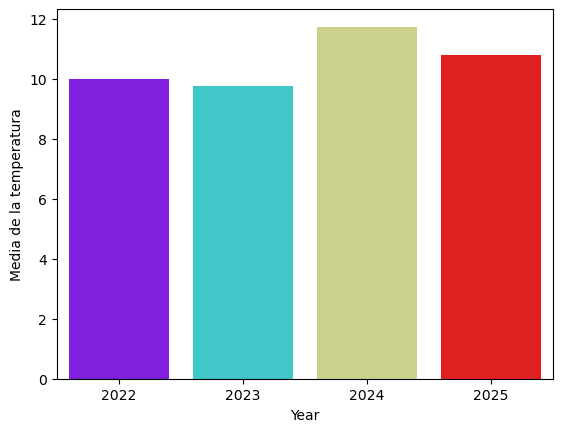

In [44]:
sns.barplot(x = "Year", 
            y = "Media de la temperatura", 
            hue = "Year", 
            data = enero_pdr, 
            palette="rainbow",
            legend=False)
plt.show()

En este caso observamos que la subida más significativa ocurrió en 2024 y sin embargo desde este año hasta el 2025 ha habido una bajada sutil. Calculemos la variación:

In [59]:
i1 = len(enero_pdr["Media de la temperatura"]) - 1
diferencia_pdr = enero_pdr["Media de la temperatura"][0] - enero_pdr["Media de la temperatura"][i1]
diferencia_pdr

np.float64(-0.8161290322580648)

En este caso, la temperatura media experimentó un aumento similar al de Pontevedra.

In [60]:
# Caldes de Montbui
enero_caldes = df_caldes[df_caldes["Mes"] == 1]
enero_caldes = enero_caldes.groupby(by="Year", as_index=False).agg({"Media de la temperatura":"mean"})
enero_caldes

,Year,Media de la temperatura
0,2022,6.325806
1,2023,7.129032
2,2024,9.374194
3,2025,9.045161


Visualicémoslo con un gráfico:

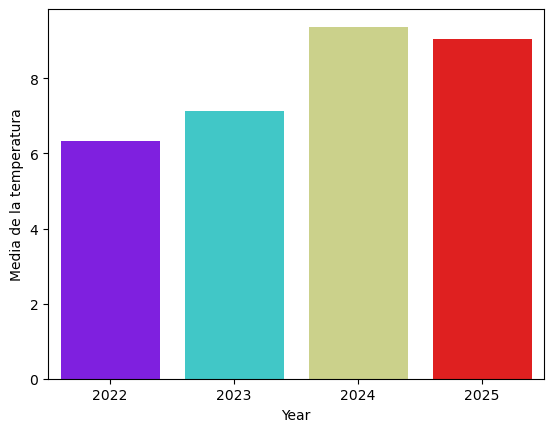

In [61]:
sns.barplot(x = "Year", 
            y = "Media de la temperatura", 
            hue = "Year", 
            data = enero_caldes, 
            palette="rainbow",
            legend=False)
plt.show()

En este caso observamos un aumento mucho más significativo en 2024 y del 2024 al 2025 hay una ligera bajada. Calculemos la variación:

In [63]:
i2 = len(enero_caldes["Media de la temperatura"]) - 1
diferencia_caldes = enero_caldes["Media de la temperatura"][0] - enero_caldes["Media de la temperatura"][i2]
diferencia_caldes

np.float64(-2.7193548387096778)

En este caso la diferencia es de algo más que dos grados y medio.
Igualmente, cabe destacar que ya sea en ciudades del norte (Pontevedra y Caldes) o en ciudades del sur (Palma del Río) ha habido un aumento de la temperatura en España en estos últimos años. Es decir, tenemos Eneros más cálidos de los que teníamos en 2022.

## 3.9. Inviernos en España entre 2022 y 2025

In [64]:
# Caldes de Montbui
invierno_caldes = df_caldes[df_caldes["Estacion"] == "Invierno"]
invierno_caldes = invierno_caldes.groupby(by="Year", as_index=False).agg({"Media de la temperatura":"mean"})
invierno_caldes = invierno_caldes[invierno_caldes["Year"].isin([2022,2023,2024,2025])]
invierno_caldes

,Year,Media de la temperatura
1,2022,8.912222
2,2023,8.043333
3,2024,9.749451
4,2025,9.306780


In [54]:
# A Coruña
invierno_coru = df_coruña[df_coruña["Estacion"] == "Invierno"]
invierno_coru = invierno_coru.groupby(by="Year", as_index=False).agg({"Media de la temperatura":"mean"})
invierno_coru = invierno_coru[invierno_coru["Year"].isin([2022,2023,2024,2025])]
invierno_coru

,Year,Media de la temperatura
1,2022,11.850000
2,2023,11.296667
3,2024,12.468132
4,2025,12.518644


In [55]:
# Pontevedra
invierno_ponte = df_ponte[df_ponte["Estacion"] == "Invierno"]
invierno_ponte = invierno_ponte.groupby(by="Year", as_index=False).agg({"Media de la temperatura":"mean"})
invierno_ponte = invierno_ponte[invierno_ponte["Year"].isin([2022,2023,2024,2025])]
invierno_ponte

,Year,Media de la temperatura
1,2022,11.165556
2,2023,9.978889
3,2024,11.074725
4,2025,11.123729


In [56]:
# Palma del Río
invierno_palmadr = df_palmadr[df_palmadr["Estacion"] == "Invierno"]
invierno_palmadr = invierno_palmadr.groupby(by="Year", as_index=False).agg({"Media de la temperatura":"mean"})
invierno_palmadr = invierno_palmadr[invierno_palmadr["Year"].isin([2022,2023,2024,2025])]
invierno_palmadr

,Year,Media de la temperatura
1,2022,12.075556
2,2023,10.336667
3,2024,11.563736
4,2025,11.328814


Si en vez de comparar Eneros comparamos inviernos, podemos observar que en ciudades del norte han sido iguales o más cálidos y en ciudades de sur (Palma del Río) han sido más fríos estos últimos años. 

## 3.10. Cuál es el rango más frecuente de velocidad del viento?

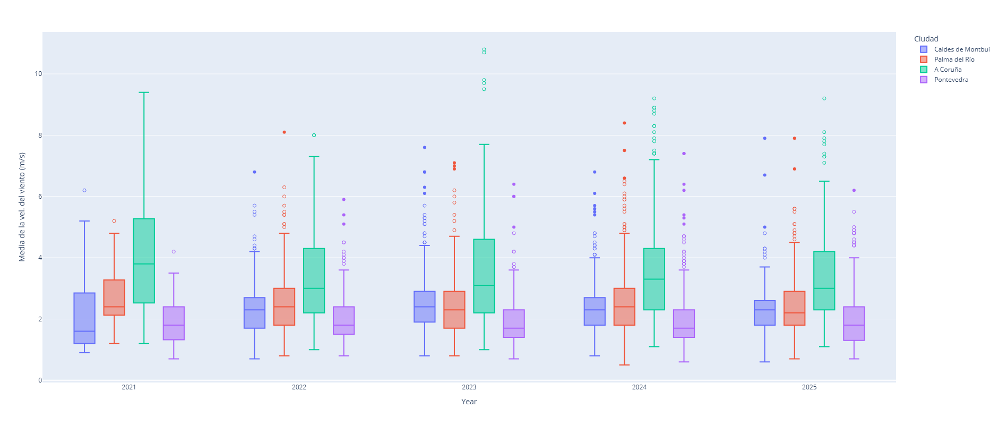

In [5]:
px.box(data_frame = df_conjunto,
       x          = "Year",
       y          = "Media de la vel. del viento (m/s)",
       category_orders = {"Ciudad": ["Caldes de Montbui", "Palma del Río", "A Coruña", "Pontevedra"]},
       color      = "Ciudad",
       points     = "suspectedoutliers",
       hover_name = "Ciudad",
       width = 1000,
       height = 800)

**Podemos observar que todas las ciudades mantienen una tendencia lineal en las velocidades del viento durante todo el año. Los datos que destacan un poco son los de 2021, y creemos que esto se debe a la falta de información, ya que solo disponemos de registros desde noviembre en adelante.**

# 3.11. Cuál es la ciudad que tiene mayor presión atmosférica media?

In [6]:
presion = df_conjunto.groupby(by = "Ciudad").agg({"Presión atmosférica" : "mean"})
df_conjunto.groupby(by = "Ciudad").agg({"Presión atmosférica" : "mean"})

,Presión atmosférica
Ciudad,
A Coruña,1009.859685
Caldes de Montbui,989.745380
Palma del Río,1010.812457
Pontevedra,1004.403833


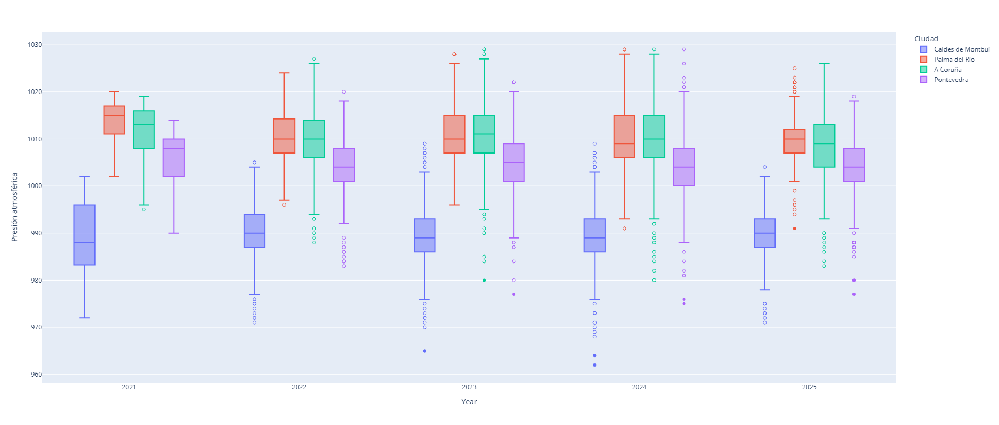

In [7]:
# Gráfica de apoyo por ciudades y años

px.box(data_frame = df_conjunto,
       x          = "Year",
       y          = "Presión atmosférica",
       category_orders = {"Ciudad": ["Caldes de Montbui", "Palma del Río", "A Coruña", "Pontevedra"]},
       color      = "Ciudad",
       points     = "suspectedoutliers",
       hover_name = "Ciudad",
       width = 1000,
       height = 800)

In [8]:
presion = df_conjunto.groupby(by = ["Ciudad", "Mes"]).agg({"Presión atmosférica": "max",})
#presion

max_presion = presion.loc[presion.groupby("Ciudad")["Presión atmosférica"].idxmax()]
max_presion

,,Presión atmosférica
Ciudad,Mes,
A Coruña,2,1029
Caldes de Montbui,2,1009
Palma del Río,1,1029
Pontevedra,12,1029


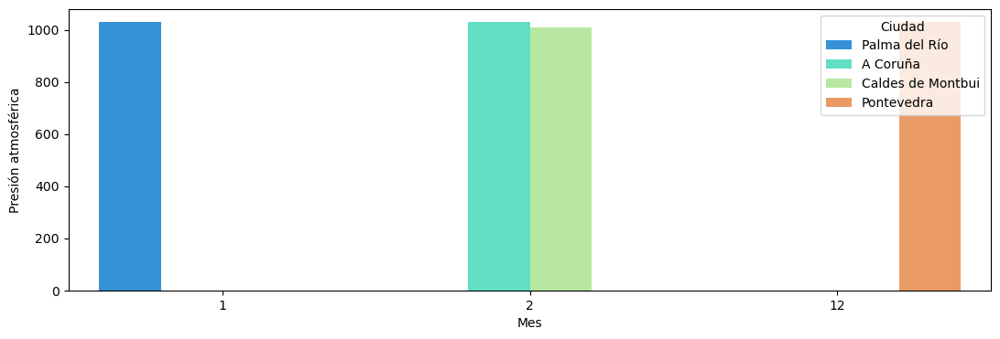

In [9]:
# Mes con más presión atmosférica por ciudades


plt.figure(figsize = (13, 4),)

sns.barplot(x = "Mes", 
            y = "Presión atmosférica", 
            hue = "Ciudad", 
            data = max_presion, 
            palette = "rainbow")

plt.show()

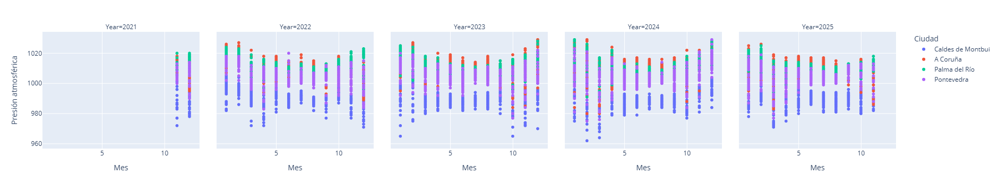

In [10]:
df = px.data.gapminder()
fig = px.scatter((df_conjunto),
                 x = "Mes",
                 y = "Presión atmosférica",
                 color = "Ciudad",
                 category_orders = {"Year": [2021,2022,2023,2024,2025]},
                 # category_orders = {"Ciudad": ["Caldes de Montbui", "Pontevedra", "A Coruña", "Palma del Río"]},
                 # size = "pop",
                 facet_col = "Year",
                 facet_col_wrap = 5)
fig.show()

**Entre ciudades hay diferéncias, como es de esperar. Lo que podemos observar es que se asemejan bastante ya que son ciudades bastante cercanas. Dependiendo de la altitud a la que se encuentren respecto al nivel del mar aumenta o disminuye, pero no podemos ver diferéncias muy significativas. La única ciudad que se aleja un poco de la media es Caldes de Montbui.**

# 3.12. Qué ciudad muestra más variabilidad en precipitaciones?

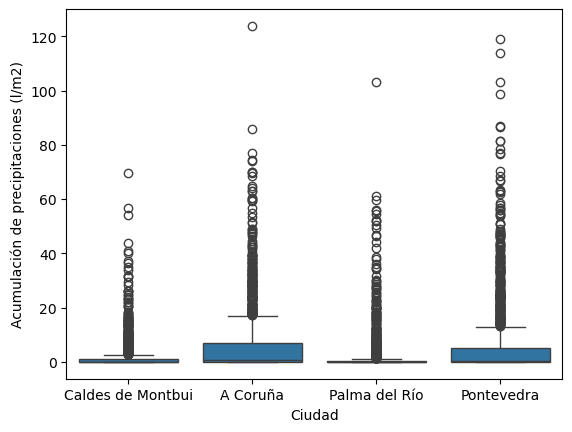

In [11]:
# Conjunto por ciudades.

sns.boxplot(x = df_conjunto["Ciudad"],
            y = df_conjunto["Acumulación de precipitaciones (l/m2)"])

plt.show()

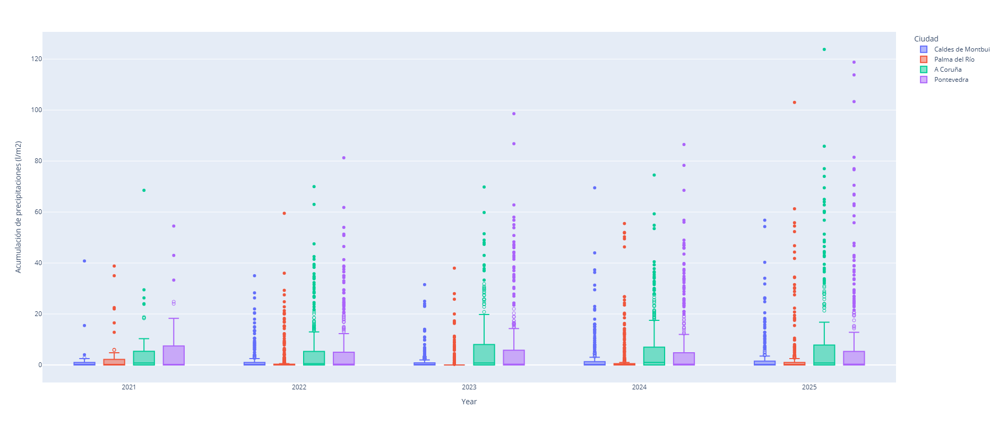

In [13]:
# Dividido por años y ciudades.

px.box(data_frame = df_conjunto,
       x          = "Year",
       y          = "Acumulación de precipitaciones (l/m2)",
       category_orders = {"Ciudad": ["Caldes de Montbui", "Palma del Río", "A Coruña", "Pontevedra"]},
       color      = "Ciudad",
       points     = "suspectedoutliers",
       hover_name = "Ciudad",
       width = 1000,
       height = 800)

**Las dos ciudades con más variabilidad de precipitaciones son las dos de Galicia, ya que tienen más outliers que se separan de las medias. Palma del Río y Caldes de Montbui muestran unas precipitaciones más regulares; aunque también tienen algunos outliers, no muestran tantos como A Coruña y Pontevedra.**

# 3.13. La temp máxima se alcanza todos los días a la misma hora?

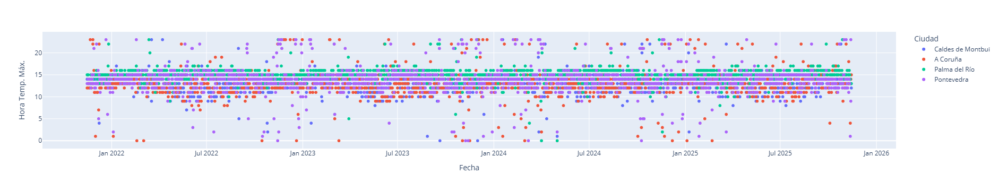

In [17]:
df_conjunto["Hora Temp. Máx."] = df_conjunto["Mom. Temp. Máx. Datetime"].dt.hour

fig = px.scatter(df_conjunto,
              x = df_conjunto["Mom. Temp. Máx. Datetime"].dt.date,
              y = df_conjunto["Hora Temp. Máx."],
              labels = {"y" : "Hora de la máxima por día", "x" : "Fecha"},
              color = "Ciudad")

fig.show()

**Como era de esperar, las temperaturas máximas se suelen alcanzar al mediodía. Hay algunos casos donde se alcanzan en horas más cencanas a la noche; suponemos que en esos días habrán otras variables meteorológicas que afectarán y por ello se alcanzan a esas horas.**

# 3.14. La temp mímima se alcanza todos los días a la misma hora?

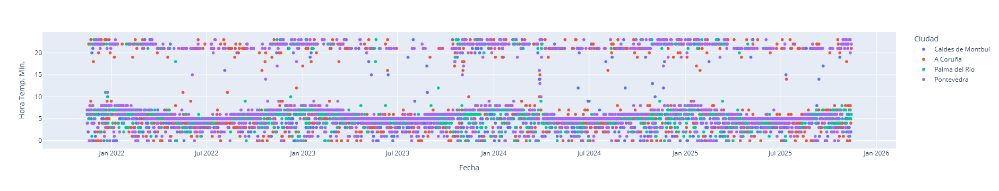

In [18]:
df_conjunto["Hora Temp. Mín."] = df_conjunto["Mom. Temp. Mín. Datetime"].dt.hour

fig = px.scatter(df_conjunto,
              x = df_conjunto["Mom. Temp. Mín. Datetime"].dt.date,
              y = df_conjunto["Hora Temp. Mín."],
              labels = {"y" : "Hora de la mínima por día", "x" : "Fecha"},
              color = "Ciudad")

fig.show()

**De nuevo, como era de esperar las temperaturas mínimas se suelen alcanzar en horas cercanas a la noche. Hay algunos casos donde se alcanzan en horas más cencanas al mediodía; suponemos que en esos días habrán otras variables meteorológicas que afectarán y por ello se alcanzan a esas horas.**

# 4. Comparaciones:

### a) Temperaturas máxima, media y mínima entre 2021 y 2025 por ciudades

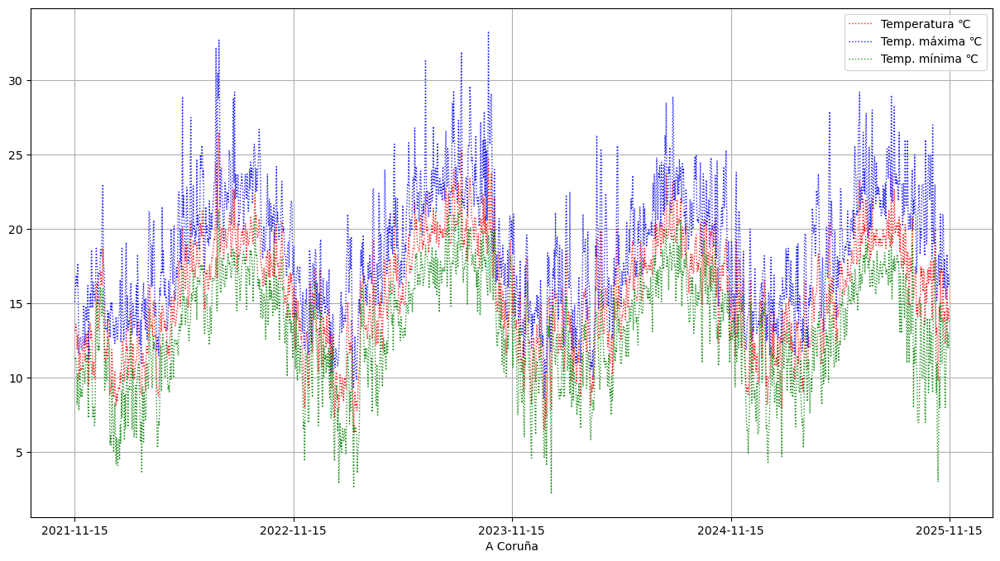

In [33]:
X = df_coruña["Fecha"]
Y1 = df_coruña["Media de la temperatura"]
Y2 = df_coruña["Temperatura máxima"]
Y3 = df_coruña["Temperatura mínima"]

colores = ["red", "blue", "green"]

plt.figure(figsize = (15, 8))

plt.plot(X,
         Y1, 
         color       = "red",
         markersize  = 3,
         linestyle   = ":",
         linewidth   = 1,
         alpha       = 0.9,
         label       = "Temperatura ℃") 

plt.plot(X,
         Y2, 
         color       = "blue",
         markersize  = 3,
         linestyle   = ":",
         linewidth   = 1,
         alpha       = 0.9,
         label       = "Temp. máxima ℃") 

plt.plot(X,
         Y3, 
         color       = "green",
         markersize  = 3,
         linestyle   = ":",
         linewidth   = 1,
         alpha       = 0.9,
         label       = "Temp. mínima ℃") 


plt.xlabel("A Coruña")
plt.legend()
plt.xticks([18_946, 19_311, 19_676, 20_042, 20_407])
plt.grid()
plt.show()

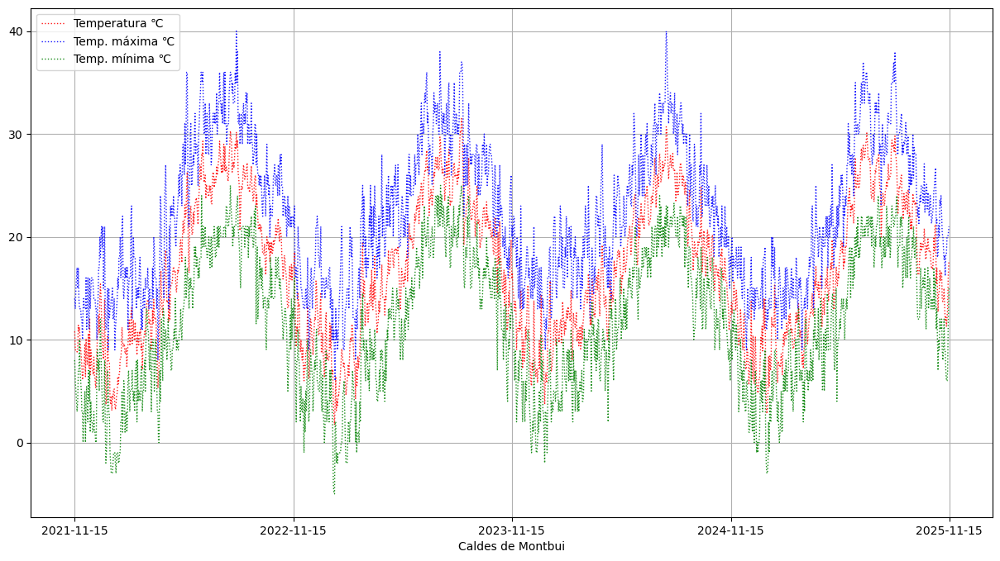

In [34]:
X = df_caldes["Fecha"]
Y1 = df_caldes["Media de la temperatura"]
Y2 = df_caldes["Temperatura máxima"]
Y3 = df_caldes["Temperatura mínima"]

colores = ["red", "blue", "green"]

plt.figure(figsize = (15, 8))

plt.plot(X,
         Y1, 
         color       = "red",
         markersize  = 3,
         linestyle   = ":",
         linewidth   = 1,
         alpha       = 0.9,
         label       = "Temperatura ℃") 

plt.plot(X,
         Y2, 
         color       = "blue",
         markersize  = 3,
         linestyle   = ":",
         linewidth   = 1,
         alpha       = 0.9,
         label       = "Temp. máxima ℃") 

plt.plot(X,
         Y3, 
         color       = "green",
         markersize  = 3,
         linestyle   = ":",
         linewidth   = 1,
         alpha       = 0.9,
         label       = "Temp. mínima ℃") 


plt.xlabel("Caldes de Montbui")
plt.legend()
plt.xticks([18_946, 19_311, 19_676, 20_042, 20_407])
plt.grid()
plt.show()

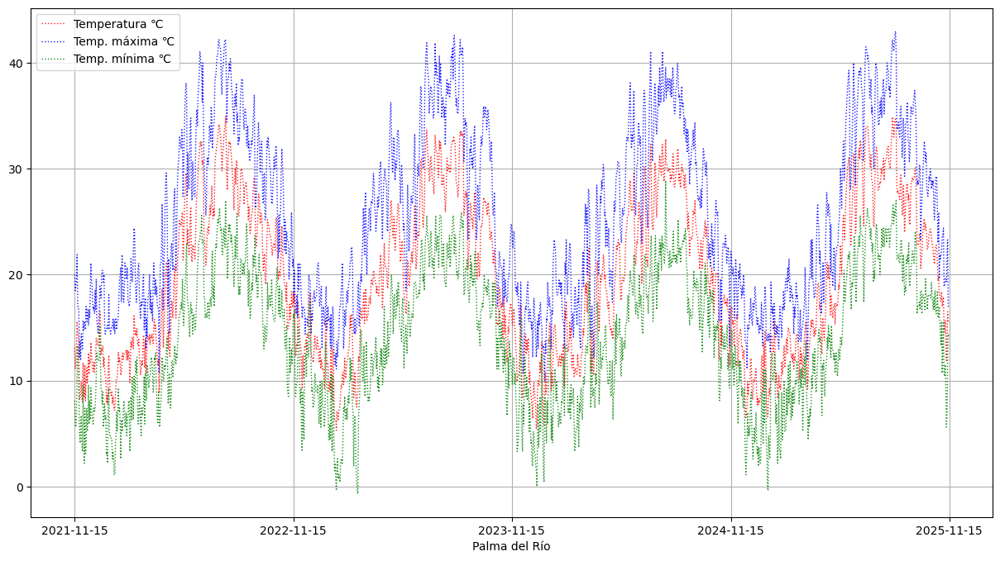

In [35]:
X = df_palmadr["Fecha"]
Y1 = df_palmadr["Media de la temperatura"]
Y2 = df_palmadr["Temperatura máxima"]
Y3 = df_palmadr["Temperatura mínima"]

colores = ["red", "blue", "green"]

plt.figure(figsize = (15, 8))

plt.plot(X,
         Y1, 
         color       = "red",
         markersize  = 3,
         linestyle   = ":",
         linewidth   = 1,
         alpha       = 0.9,
         label       = "Temperatura ℃") 

plt.plot(X,
         Y2, 
         color       = "blue",
         markersize  = 3,
         linestyle   = ":",
         linewidth   = 1,
         alpha       = 0.9,
         label       = "Temp. máxima ℃") 

plt.plot(X,
         Y3, 
         color       = "green",
         markersize  = 3,
         linestyle   = ":",
         linewidth   = 1,
         alpha       = 0.9,
         label       = "Temp. mínima ℃") 


plt.xlabel("Palma del Río")
plt.legend()
plt.xticks([18_946, 19_311, 19_676, 20_042, 20_407])
plt.grid()
plt.show()

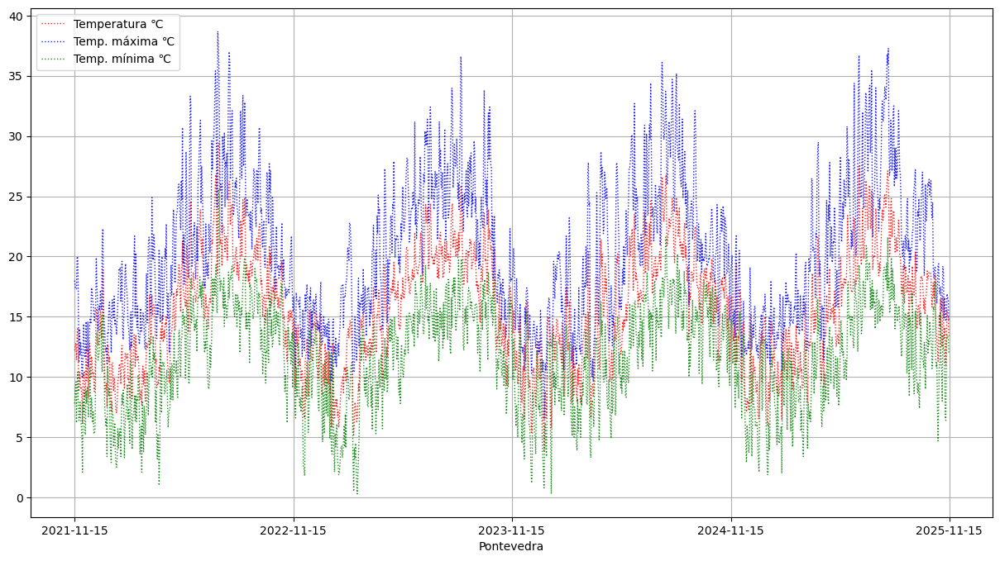

In [36]:
X = df_ponte["Fecha"]
Y1 = df_ponte["Media de la temperatura"]
Y2 = df_ponte["Temperatura máxima"]
Y3 = df_ponte["Temperatura mínima"]

colores = ["red", "blue", "green"]

plt.figure(figsize = (15, 8))

plt.plot(X,
         Y1, 
         color       = "red",
         markersize  = 3,
         linestyle   = ":",
         linewidth   = 1,
         alpha       = 0.9,
         label       = "Temperatura ℃") 

plt.plot(X,
         Y2, 
         color       = "blue",
         markersize  = 3,
         linestyle   = ":",
         linewidth   = 1,
         alpha       = 0.9,
         label       = "Temp. máxima ℃") 

plt.plot(X,
         Y3, 
         color       = "green",
         markersize  = 3,
         linestyle   = ":",
         linewidth   = 1,
         alpha       = 0.9,
         label       = "Temp. mínima ℃") 


plt.xlabel("Pontevedra")
plt.legend()
plt.xticks([18_946, 19_311, 19_676, 20_042, 20_407])
plt.grid()
plt.show()

### b) Evolución de la temperatura media, máxima y mínima en este período

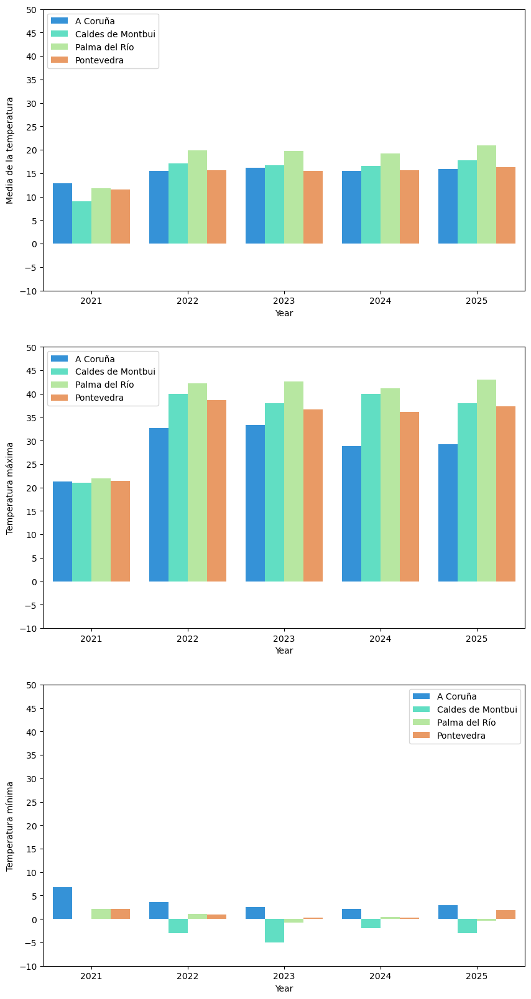

In [41]:
plt.figure(figsize = (10,20))

plt.subplot(3, 1, 1) 
sns.barplot(x = "Year", 
            y = "Media de la temperatura", 
            hue = "Ciudad", 
            data = df_conjunto.groupby(by = ["Year", "Ciudad"]).agg({"Media de la temperatura": "mean"}), 
            palette = "rainbow")
plt.yticks([-10, -5, 0, 5, 10, 15, 20, 25, 30, 35, 40, 45, 50])

plt.legend(loc="upper left",
           fontsize=10)

plt.subplot(3, 1, 2)
sns.barplot(x = "Year", 
            y = "Temperatura máxima", 
            hue = "Ciudad", 
            data = df_conjunto.groupby(by = ["Year", "Ciudad"]).agg({"Temperatura máxima": "max"}), 
            palette = "rainbow")
plt.yticks([-10, -5, 0, 5, 10, 15, 20, 25, 30, 35, 40, 45, 50])

plt.legend(loc="upper left",
           fontsize=10)

plt.subplot(3,1, 3)
sns.barplot(x = "Year", 
            y = "Temperatura mínima", 
            hue = "Ciudad", 
            data = df_conjunto.groupby(by = ["Year", "Ciudad"]).agg({"Temperatura mínima": "min"}), 
            palette = "rainbow")
plt.yticks([-10, -5, 0, 5, 10, 15, 20, 25, 30, 35, 40, 45, 50])

plt.legend(loc="upper right",
           fontsize=10)

plt.show()

### c) Boxplots de la variable presión atmosférica por ciudades

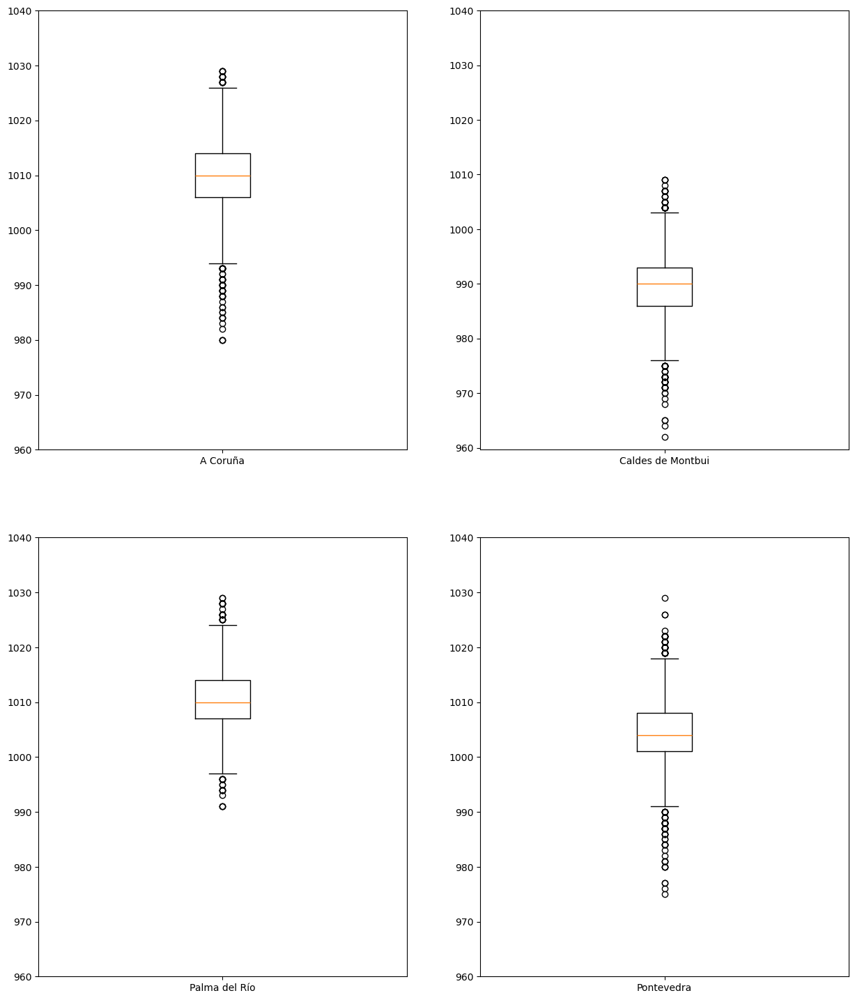

In [11]:
plt.figure(figsize = (15, 18))

plt.subplot(2, 2, 1)  
plt.boxplot(x = df_coruña["Presión atmosférica"],
            tick_labels = ["A Coruña"])
plt.yticks([960, 970, 980, 990, 1_000, 1_010, 1_020, 1_030, 1_040])
plt.ylabel("")

plt.subplot(2, 2, 2) 
plt.boxplot(x = df_caldes["Presión atmosférica"],
            tick_labels = ["Caldes de Montbui"])
plt.yticks([960, 970, 980, 990, 1_000, 1_010, 1_020, 1_030, 1_040])
plt.ylabel("")

plt.subplot(2, 2, 3) 
plt.boxplot(x = df_palmadr["Presión atmosférica"],
            tick_labels = ["Palma del Río"])
plt.yticks([960, 970, 980, 990, 1_000, 1_010, 1_020, 1_030, 1_040])
plt.ylabel("")

plt.subplot(2, 2, 4)  
plt.boxplot(x = df_ponte["Presión atmosférica"],
            tick_labels = ["Pontevedra"])
plt.yticks([960, 970, 980, 990, 1_000, 1_010, 1_020, 1_030, 1_040])
plt.ylabel("")

plt.show()

In [ ]:
###############################################################################################